# Images Resolution Enhancement Using CNN

In this notebook, we will implement a CNN model which reconstructs low-resolution (LR) images into enhanced-resolution (ER) images. The reconstructed images are expected to have much better quality at the edges of colors, as well as noticeable improvement in the overall quality.

#### This code aims to achieve that in three stages:

1- Preprocessing stage: In this stage, a dataset consisting of 50,000 high-resolution (HR) images will be used. The dataset used in this code is the ImageNet dataset https://www.kaggle.com/competitions/imagenet-object-localization-challenge/data, which originally consists of 1,500,000 HR images, but due to lack of time and computational power, only 50,000 images are used in this project. Many steps will be done in this stage, which will be elaborated later in this notebook.

2- Training the model: This stage is where the input images are fed into the CNN model, and results are gathered.

3- Validation stage: About 15,000 images were designated for this stage, but only a few samples will be displayed. In this stage, there is going to be two assessment methods: 1) Visual assessment, which is achieved by plotting the LR, ER, and HR versions of the same image and then visual difference between the three can be compared. 2) Accuracy calculation, which is achieved by using a metric dedicated to evaluate difference in images quality. This metric is called Peak Signal-to-Noise Ratio (PSNR).

## Preprocessing:

This stage consists of the following steps:

1- Import necessary packages for the preprocessing stage

2- Filter images based on certain specifications

3- Define essential variables for the code

4- Load the data

5- Scale the data

6- Arrange and prepare input features and targets for the model

### 1- Importing necessary packages:

In [1]:
from keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from IPython.display import display
import tensorflow as tf
import os, shutil, PIL, keras
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"   # To avoid a performance-related warning which
                                            # halts the code.

### 2- Images filtering:

Before loading the data, we must first understand the data that will be used in our code. By looking at the dataset in hand, it can be noticed that many images have problems that need to be resolved. Note that the filtering process was performed on a dataset of 100,000 images, and the 50,000 images used in this code were pulled out of the result of the filtering process. The problems that were resolved are as following:

1- Some images have a resolution that is less than the crop size resolution required in our model

2- Some images are given in grayscale color mode (black and white)

3- Some images have a very high resolution that even if it gets transformed into LR, it is still high quality. Extracting features from these images is very inefficient.

#### The following code is performed to solve the previous problems:

Originally, this code which consists of three functions was saved as a separate model so we can later on just import it or some of its functions.

Function "Remove1DImages" deletes all the grayscale images in our dataset; meaning if the number of channels in a certain image is not 3, then it will be deleted.

Function "RemoveHDImages" deletes all the images that have a very high resolution.

Function "RemoveLowres" deletes all the images that have a height or weight of less than the crop sizes determined for this model.

In [2]:
def Remove1DImages(path):

    os.chdir(path)
    
    for _ in os.listdir():                 # Here, " _ " character was used since we need
                                           # a temporary variable.
        with PIL.Image.open(_) as image:
                                           # Images were first opened using PIL package,
            array = img_to_array(image)    # then transformed into arrays to check the
            channels = array.shape[-1]     # shape of their last axis, which is the
                                           # channels axis.
        if channels != 3:
                                           # If the amount of channels is not 3, delete
            os.remove(_)                   # the image. Note that we have to use "with"
                                           # to automatically close the image after
def RemoveHDImages(path):                  # we read it, otherwise we can't use "os.remove()".
    
    os.chdir(path)
    i = os.listdir()
    
    for _ in i:
        
        with PIL.Image.open(_) as image:
            
            width = image.size[0]             # Here, images were opened and if they exceeded
            height = image.size[1]            # the HR limit, they will be deleted. The limit 
                                              # was determined to be (800x800).
        if width >= 800 or height >= 800:     
            
            os.remove(_)
            
def RemoveLowres(path):

    os.chdir(path)
    i = os.listdir()
    
    for _ in i:
        
        with PIL.Image.open(_) as image:
            
            width = image.size[0]
            height = image.size[1]           # The same principle was applied here, except
                                             # now we need to delete images lower than our
        if width < 500 or height < 300:      # limit. The limit was specified based on our
                                             # determined cropping size.
            os.remove(_)
            
# Remove1DImages('./path')
# RemoveHDImages('./path')
# RemoveLowres('./path')

### 3- Define essential variables:

Now that our dataset is ready, we can start our preprocessing by defining constant variables that will be used frequently in this code. The images that will be used in this code were filtered to fit a certain shape:

1- Images should have a resolution of at least (500x300) because images will be cropped down to (498x300) to unify the resolution of all images used. The reason that width is set to 498 and not 500 is because 500 is not divisible on the upscale factor, but 498 is.

2- An upscale factor of 3 was chosen. This way, the LR images will have a resolution that is equal to the crop size divided by the upscale factor.

3- In this model, we noticed a big enhancement in accuracy if we only used the luminance channel in a YUV color mode instead of using the traditional RGB image. Therefore, the amount of channels was determined to be 1.

In [3]:
channels = 1
cropped_width = 498
cropped_height = 300
upscale_factor = 3

input_width = cropped_width // upscale_factor
input_height = cropped_height  // upscale_factor

path = "C:/Users/MIS/Desktop/HTU/Python/High-res/ImageNet/model"

### 4- Loading images:

To load the images into our environment, "image_dataset_from_directory()" was chosen instead of other alternatives like "flow_from_directory()". The reason for that is because our images don't have to be classified into classes. Instead, we just have a single folder containing all the images for both training set and testing set, so "image_dataset_from_directory()" does the job perfectly.

In [4]:
train_set = image_dataset_from_directory(
    path,
    image_size=(cropped_width, cropped_height),   # At first, we have to load the images at
    validation_split=0.2,                         # their original cropped resolution, then
    subset='training',                            # some processing will have to be done to 
    seed=240,                                     # transform them to their LR version.
    batch_size = 32,                              
    label_mode=None)                              # Note that we used a 80/20 split for the 
                                                  # training and testing sets. We also used a 
test_set = image_dataset_from_directory(          # batch size of 32. While there are benefits
    path,                                         # for low or high batch size (lower = more
    image_size=(cropped_width, cropped_height),   # accurate, higher = faster running time),
    validation_split=0.2,                         # 32 was the maximum possible value due to
    subset='validation',                          # limited memory issues.
    seed=240,
    batch_size = 32,                              # Label mode has to be 'None' because our
    label_mode=None)                              # model is a regression model.

Found 50000 files belonging to 1 classes.
Using 40000 files for training.
Found 50000 files belonging to 1 classes.
Using 10000 files for validation.


### 5- Data scaling:

Data scaling is an essential step in any Machine Learning model, because normalizing the data makes the model understand the difference between each value as intended, thus gives better results. Here, scaling was done using the "map()" function due to the nature of our data. When we loaded the data using "image_dataset_from_directory()", the data was loaded as "Data.Dataset" API, which is basically Python's way of saving memory while storing data.

In [5]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image
    
train_set = train_set.map(scaling)
test_set = test_set.map(scaling)

"""
We can view the shape of our sets using the following code. However, it does not work 
here because the size of the data is too large, and thus there isn't enough memory 
for this process.

train_set_shape = list(train_set.as_numpy_iterator())
print(train_set_shape.shape())

test_set_shape = list(train_set.as_numpy_iterator())
print(test_set_shape.shape())
"""

"\nWe can view the shape of our sets using the following code. However, it does not work \nhere because the size of the data is too large, and thus there isn't enough memory \nfor this process.\n\ntrain_set_shape = list(train_set.as_numpy_iterator())\nprint(train_set_shape.shape())\n\ntest_set_shape = list(train_set.as_numpy_iterator())\nprint(test_set_shape.shape())\n"

We can view a sample of our data using the following code. Here, we used the "take()" function, which takes a specified number of batches and iterates over that number. We also used the "IPython.display.display()" function to display the images.

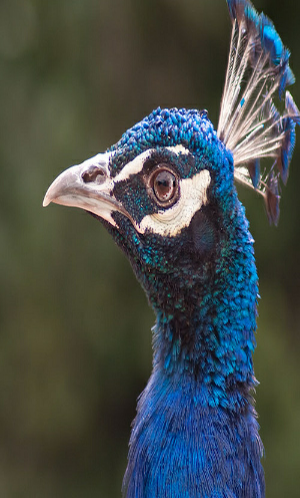

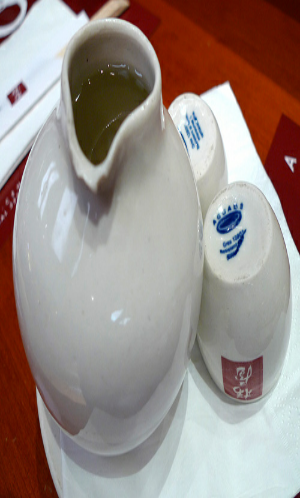

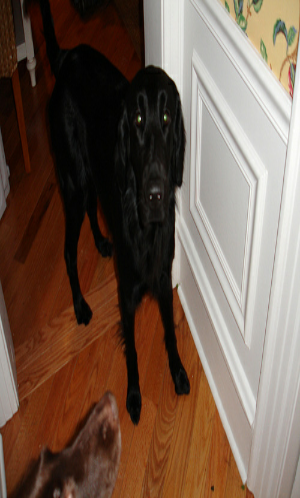

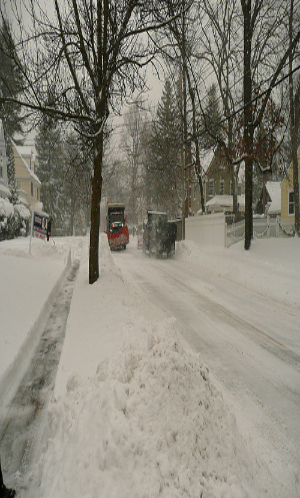

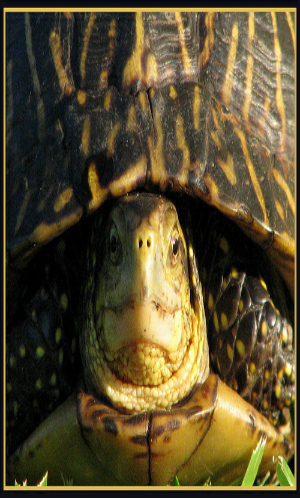

...

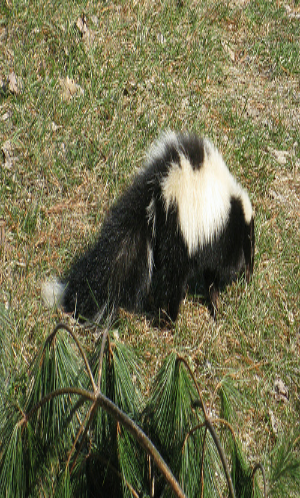

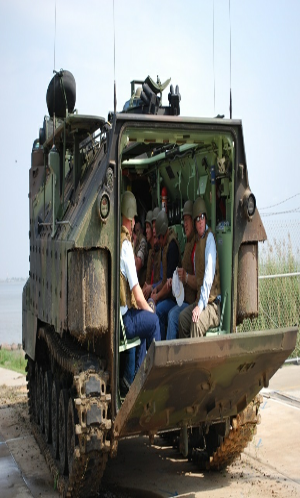

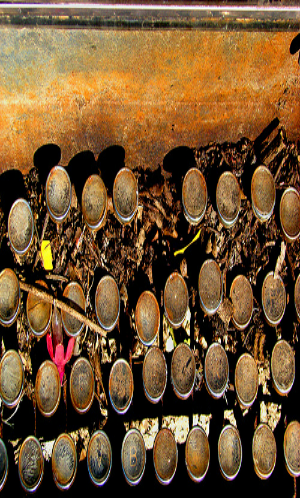

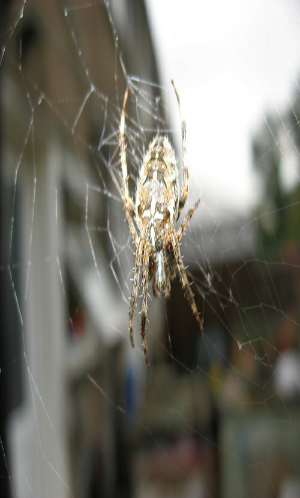

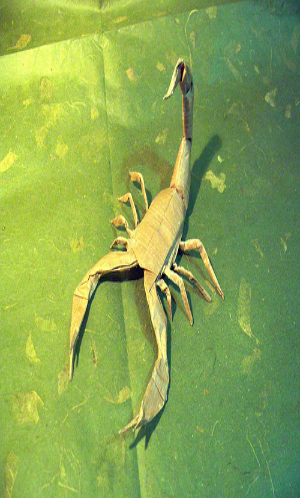

In [6]:
for batch in train_set.take(1):
    for img in batch:
        display(array_to_img(img)) 

### Preparing features and targets:

As mentioned before, the input features for our model are the LR images which are gathered from the original HR images, while the targets for our model are the original HR images.

Here, we have two functions:

1- Process features: This function first converts the RGB image into YUV color mode, because we only need the luminance channel, which is the Y channel. After that, we retrieve only the channel we need by splitting the YUV image which consists of Y, U, and V channels into 3 images, each image represents a single channel. Then, the Y channel will be downscaled by an upscaling factor. The result will be the LR image.

2- Process target: This function does the exact same thing as the previous function, except it does not resize the image since our targets must be the same resolution as they were originally.

In [7]:
def process_features(input, new_width, new_height):
    input = tf.image.rgb_to_yuv(input)
    last_axis = len(input.shape) -1                 # This line retrieves the index of the last axis
    y, u, v = tf.split(input, 3, axis=last_axis)    # in our data, which is the channels dimension.
    return tf.image.resize(y, [new_width, new_height], method="area")

def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_axis = len(input.shape) -1
    y, u, v = tf.split(input, 3, axis=last_axis)
    return y

train_set = train_set.map(lambda x: (process_features(x, input_width, input_height),process_target(x)))

test_set = test_set.map(lambda x: (process_features(x, input_width, input_height),process_target(x)))

# Pay attention that the train set and test set now consist of a tuple: the first index is the
# features, while the second index is the targets.

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Further visual verification can be made here to see a sample of the LR single-channel images and the HR single-channel images alongside each other.

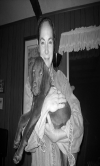

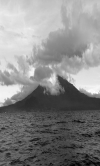

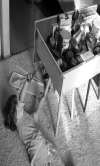

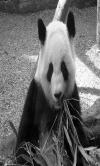

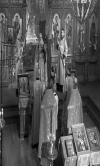

...

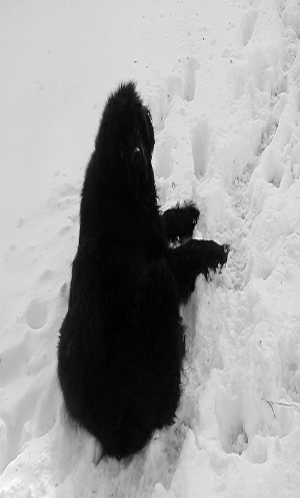

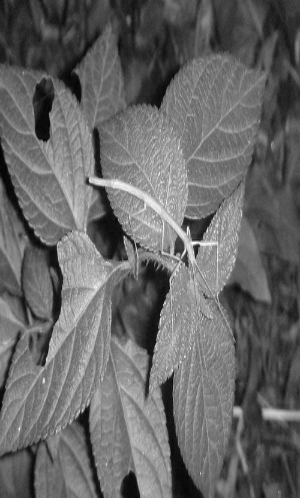

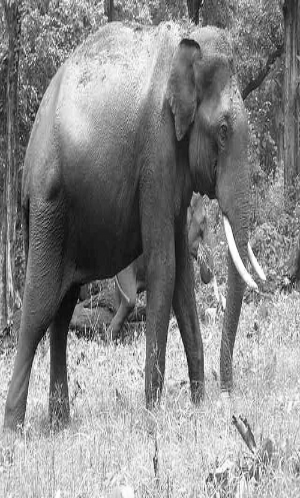

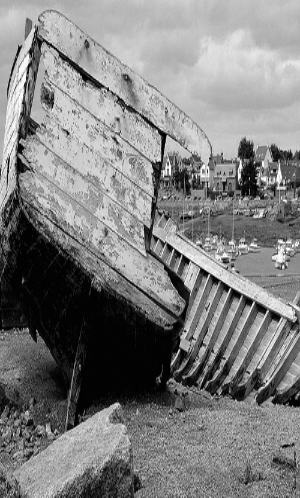

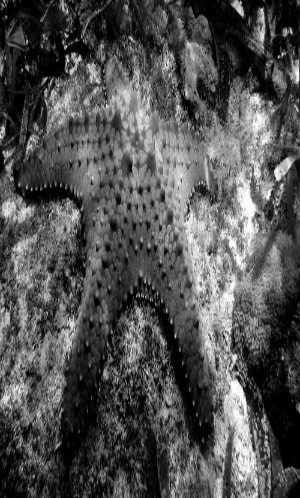

In [8]:
for batch in train_set.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## CNN Model:

This stage consists of the following steps:

1- Import necessary packages for the model stage

2- Create our RDB block as a function

3- Construct all the layers of our model

4- Compile and fit the model

### 1- Importing necessary packages:

In [9]:
from keras.layers import Conv2D, Add
from keras.callbacks import EarlyStopping

### 2- Building the RDB block:

The purpose of using Residual Dense Blocks (RDBs) in this model is to extract hierarchical features from the original LR images. RDBs extract complex and high-level features by extracting as many hierarchical features as possible. It does so by sharing the output of each layer within as feedback. The following image demonstrates that process:

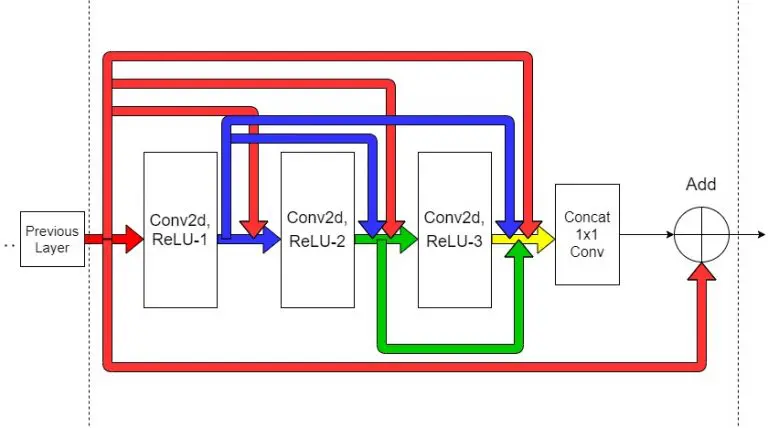

In the previous image, we can see all the processes that will be performed in our RDB block. Firstly, the input of the CNN layer that comes before the RDB block (shallow layer) enters the RDB block and gets concatenated locally based on the amount of channels it has. Then, that concatenated input enters a specified amount of convolutional layers (3 in this RDB block). Lastly, the results are all gathered and added to the inputs.

While the hyperparameters inside the RDBs used in this model were adjusted to achieve better results, they were not optimized enough due to the lack of computational power and time available. Without the RDBs, each epoch takes roughly 20 minutes. With the RDBs present, each epoch takes 2 hours and 40 minutes, which made it hard to optimize well enough in the given time window.

In [10]:
def rdb_block(inputs, numLayers):
    
    channels = inputs.get_shape()[-1]      # Get the amount of channels in our data, which is 1.
    
    storedOutputs = [inputs]
    
    for _ in range(numLayers):             # Here, "numLayers" represents the number of Conv2D layers
                                           # that are used for the RDB feature extraction process.
        localConcat = tf.concat(storedOutputs, axis=-1)
        
        out = Conv2D(filters=channels, kernel_size=3, padding="same",
            activation="relu")(localConcat)
        
        storedOutputs.append(out)               # The outputs of each Conv2D layer are appended.
        
    finalConcat = tf.concat(storedOutputs, axis=-1)
    finalOut = Conv2D(filters=channels, kernel_size=1,    # This Conv2D layer is called "pointwise"
        padding="same", activation="relu")(finalConcat)   # convolution layer. It basically prepares
                                                          # the data to be added to the original input
    finalOut = Add()([finalOut, inputs])                  # and exit the RDB block to enter the next
                                                          # layer in the CNN.
    return finalOut

### CNN layers construction:

A Convolutional Neural Network mainly consists of Conv layers. In classification models, Dense layers are also used alongside Flatten layers. However, since this model is a regression model, only Conv layers are used. The hyperparameters for these layers and the amount of layers used underwent various changes and tinkering to achieve the best result possible.

It can be noticed that the input layer of our model has a (None, None, channels) shape. The reason for that is because we do not know the shape of the images that will be used for data validation, since every image will most likely have different resolution than the other. 

#### Important: We can notice that the last Conv2D layer used has a "different" amount of filters than the previous layers. Since the input LR image has to be upscaled to match the original HR resolution at some point, a Pixel Shuffling method was used. In this method, we multiply the LR resolution by the same upscale factor that was used to downscale the LR image from the original HR image. This way, the output of the model will be the ER image. 

#### This Pixel Shuffling method is very simple: at the last layer of the model, the amount of channels were multiplied by the square of the upscale factor, then "tf.nn.depth_to_space()" function transforms the output of that layer from (Width, Height, Channels * Factor^2) into (Width * Factor, Height * Factor, Channels).

In [11]:
def Model(channels, upscale_factor):

    inputs = keras.Input(shape=(None, None, channels))
    X = Conv2D(64, 5, padding='same', activation='relu', kernel_initializer='Orthogonal')(inputs)
    X = Conv2D(64, 3, padding='same', activation='relu', kernel_initializer='Orthogonal')(X)
    X = rdb_block(X, numLayers=3)
    X = Conv2D(32, 3, padding='same', activation='relu', kernel_initializer='Orthogonal')(X)
    X = rdb_block(X, numLayers=3)
    X = Conv2D(channels * (upscale_factor**2), 3, padding='same', activation='relu', kernel_initializer='Orthogonal')(X)
    
    outputs = tf.nn.depth_to_space(X, upscale_factor)
    return keras.Model(inputs, outputs)

Here, we added an extra optional callback called "early stopping". This callback stops the method from training if the training process is not improving; meaning that nothing new is being learned, thus computational power is being wasted for no benefit. In addition to that, overfitting - in some cases - could be resolved by using this callback. Here, our callback would monitor the "loss" metric, and if 10 back-to-back epochs had a difference of 0.0001 or less of that "loss" metric, the model will stop training.

In [12]:
early_stopping = EarlyStopping(monitor='loss',patience=10, min_delta=0.0001)
model = Model(channels, upscale_factor)        
                                               # Adam optimizer due to its efficiency, MSE
model.compile(optimizer='adam', loss='MSE')    # loss function because it's a regression model.

model.summary()                                # Show a summary of the layers in our model.

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1664        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 conv2d_1 (Conv2D)              (None, None, None,   36928       ['conv2d[0][0]']                 
                                64)                                                           

__________________________________________________________________________________________________


In [13]:
model.fit(train_set, epochs=40, callbacks= [early_stopping], validation_data = test_set)

                                              # Here, we can save the entire model so we can use
model.save('Y_Model_ImageNet_RDB_(x8).h5')    # it again in the future without the need of fitting  
                                              # the model again, thus saving time.

Epoch 1/40
1250/1250 [==============================] - 1408s 1s/step - loss: 0.0086 - val_loss: 0.0068
Epoch 2/40
1250/1250 [==============================] - 1440s 1s/step - loss: 0.0066 - val_loss: 0.0065
Epoch 3/40
1250/1250 [==============================] - 1414s 1s/step - loss: 0.0065 - val_loss: 0.0064
Epoch 4/40
1250/1250 [==============================] - 1411s 1s/step - loss: 0.0064 - val_loss: 0.0064
Epoch 5/40
1250/1250 [==============================] - 1398s 1s/step - loss: 0.0064 - val_loss: 0.0064
Epoch 6/40
1250/1250 [==============================] - 1420s 1s/step - loss: 0.0063 - val_loss: 0.0063
Epoch 7/40
1250/1250 [==============================] - 1422s 1s/step - loss: 0.0063 - val_loss: 0.0063
Epoch 8/40
1250/1250 [==============================] - 1390s 1s/step - loss: 0.0062 - val_loss: 0.0063
Epoch 9/40
1250/1250 [==============================] - 1433s 1s/step - loss: 0.0062 - val_loss: 0.0062
Epoch 10/40
1250/1250 [==============================] - 1392s 1

Note: The previous output cell is NOT the real output cell for the given model. The actual model takes 2 hours and 40 minutes per epoch. Due to lack of available time, re-doing the whole training process just to get the output cell result was not possible. The saved model that can be seen in the previous cell has been sent along with this Jupyter notebook with the name of "Y_Model_ImageNet_RDB.h5". You can load it using keras.models.load_model("Y_Model_ImageNet_RDB.h5") and verify the layers present in it using model.summary(). If an error presists after loading the model, do the following: 1- model = model.keras.models.load_model("Y_Model_ImageNet_RDB.h5", compile = False) 2- model.compile(optimizer = 'adam', loss = 'MSE')

## Validation:

This stage consists of the following steps:

1- Import necessary packages for the validation stage

2- Define a plotting function

3- Prepare the images for validation and plot the results

### 1- Importing necessary packages:

In [14]:
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import matplotlib.pyplot as plt

### 2- Plotting function:

The purpose of the validation process is to assess our results. The first method of doing so is to assess them visually by defining a function that plots the LR, ER, and HR images with an allocated area for a zoomed version of these images.

Firstly, we specify the variables for our function. In this case, we need a variable for: 1) Image that needs plotting 2) Title of the image 3) Zoom coordinates with default values that were found to suit most images, but if in certain cases they must be changed, you can do that.

Secondly, we create a subplot which can accept two images in the same figure (first image is the image itself, and the second image is the zoomed area).

Thirdly, specify the axes of the original image (which are called parent axes), and the axes of the zoomed image (which are called inset axes) for which the images will be plotted against.

Lastly, specify the coordinates for the zoomed area, draw extra lines to indicate the location of the zoomed image, and plot the final result.

In [15]:
def plot_results(img, prefix, title, z1=200, z2=300, z3=150, z4=250):
    
    img_array = img_to_array(img)                          # Here, images are prepared to be plotted
    img_array = img_array.astype("float32") / 255.0        # by transforming them into arrays and
                                                           # scaling their values.

    figure, parent = plt.subplots()                        # A subplot is created for the original
                                                           # image and the zoomed image.
        
        
    parent.imshow(img_array[::-1], origin="lower")         # The reason why we want to plot the figure
                                                           # in reverse here is because when we use
    #plt.yticks(visible=False) (Optional)                  # img_to_array, the height and width
    #plt.xticks(visible=False) (Optional)                  # locations get inverted. The "origin"
                                                           # parameter specifies the location of the            
    plt.title(title)                                       # origin point (0, 0). Left lower corner
                                                           # in this case.
    
    
    inset = zoomed_inset_axes(parent, 2, loc='upper left') # Define the inset axes based on the parent
    inset.imshow(img_array[::-1], origin="lower")          # axes and specify the zoom value (2x, 3x, etc).
                                                           # We also specify the location for the zoom
                                                           # image, upper left corner in this case.

    x1, x2, y1, y2 = z1, z2, z3, z4                        

    inset.set_xlim(x1, x2)                                 # Specify the X axis coordinates for the 
                                                           # zoom image.
        
    inset.set_ylim(y1, y2)                                 # Specify the Y axis coordinates for the
                                                           # zoom image.
        
    plt.yticks(visible=False)                              # Remove the zoomed area axes numbers.
    plt.xticks(visible=False)


    mark_inset(parent, inset, loc1=1, loc2=3, fc="none", ec="blue")  # Draw extra lines indicating the
                                                                     # location of the zoom image. "loc1"
    plt.show()                                                       # and "loc2" are corners of the inset
                                                                     # axes, "fc" and "ec" are lines colors.

### 3- Processing validation images and comparing results:

In order to plot the images and compare the results, we must first prepare the data for that step. We start by defining some key variables that will be used frequently in the processing step. Then, we choose the images that we want to use for our "for-loop" that is responsible for the validation process. We also define custom zoom coordinates for some images inside a dictionary. Keys of that dictrionary are the indices of the images that need custom zooming, and values are the zooming coordinates.

In [16]:
total_bicubic_psnr = 0.0      # Variable for total average LR-HR PSNR.
total_test_psnr = 0.0         # Variable for total average ER-HR PSNR.

valid_path = "C:/Users/MIS/Desktop/HTU/Python/High-res/ImageNet/valid"  # Path of the folder containing  
                                                                        # images for validation.
    
valid_img_paths = sorted([os.path.join(valid_path,img_name)             # List comprehension to get the
                        for img_name in os.listdir(valid_path)])        # full path of the images.

visualize_results = []                               
for _ in (9, 15, 17, 23, 32, 39, 50, 637):                              # Indices of required image     
    visualize_results.append(valid_img_paths[_])                        # samples for validation.
        
z = {1: [150, 300, 230, 330], 3: [280, 380, 150, 250], 4: [200, 300, 180, 280],  5: [200, 330, 175, 300]}

After preparing the needed variables for the validation process, we can start processing our data. This part consists of the following steps:

1- Open images required for validation and prepare them for entering the CNN model. They must be compatible with the model, which is why the images will be first downscaled to LR, then Y channel will be gathered and scaled, then reshaped into (Batch, Width, Height, Channels) which is the shape accepted by our model.

2- Predict the outcome of the processed image and then reshape it back to (Width, Height, Channels), "unscale" it back to its original values, and add a clipping function which converts all values higher than 255 to 255, and all values less than 0 to 0. This is very important because some images may have their colors altered; rendering them useless for our validation process.

3- Transform the output from array to image using PIL package, but first it must be in the shape of (Width, Height), so it will be reshaped to remove the shape of the channels axis. Then, resize the other channels so they can be merged together with the Y channel. The outcome of that mixture will be converted back to RGB so we can get the same colors as the original images.

4- Display the images using the plotting function that we defined prior to this step. Note that some plots need custom zooming coordinates. Therefore, an "if-statement" was used.

5- Display the PSNR of each image, as well as the total average PSNR of all the images.

1/1 [==============================] - 0s 194ms/step


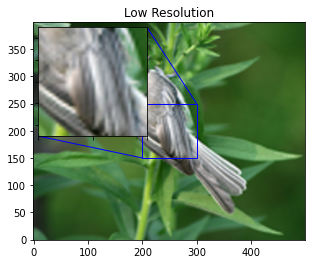

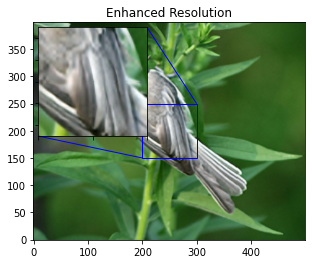

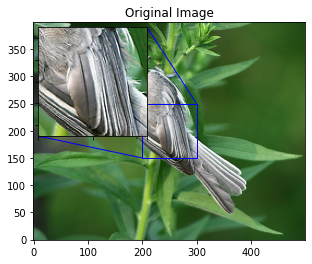

PSNR of LR image and HR image is: 25.208151
PSNR of ER image and HR image is: 25.868135
1/1 [==============================] - 0s 197ms/step


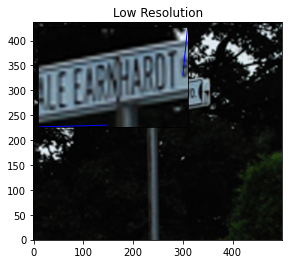

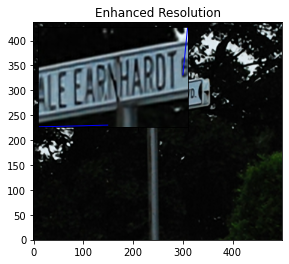

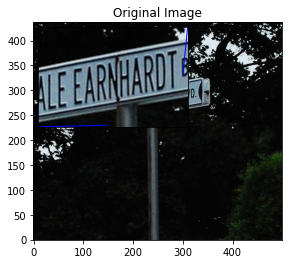

PSNR of LR image and HR image is: 22.209454
PSNR of ER image and HR image is: 23.695824
1/1 [==============================] - 0s 71ms/step


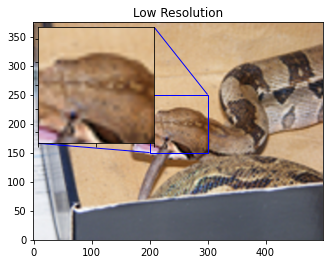

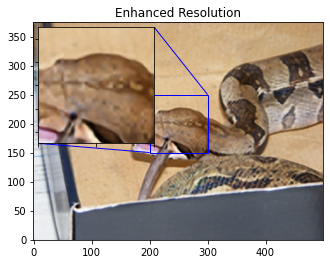

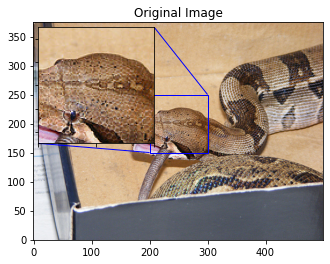

PSNR of LR image and HR image is: 23.062840
PSNR of ER image and HR image is: 23.548843
1/1 [==============================] - 0s 71ms/step


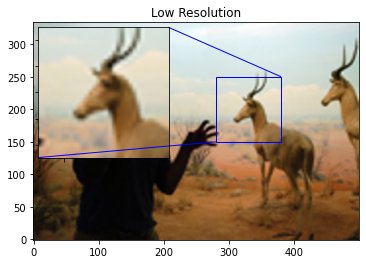

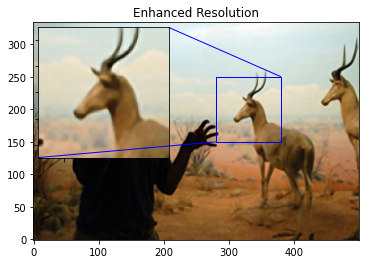

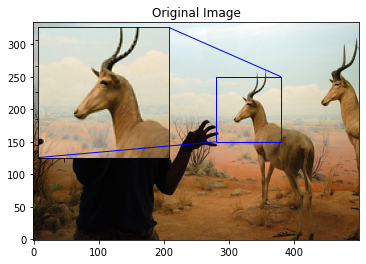

PSNR of LR image and HR image is: 27.127733
PSNR of ER image and HR image is: 28.107628
1/1 [==============================] - 0s 65ms/step


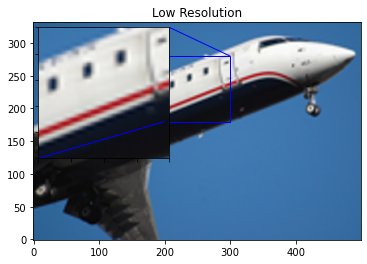

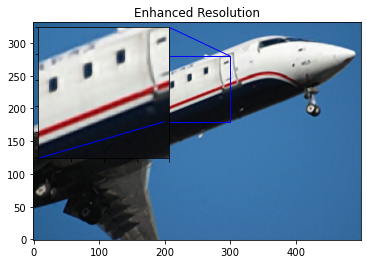

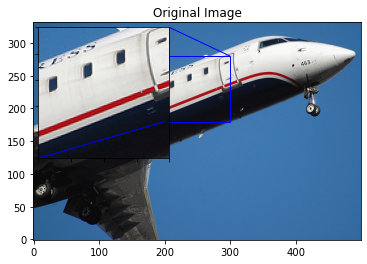

PSNR of LR image and HR image is: 27.051031
PSNR of ER image and HR image is: 28.018768
1/1 [==============================] - 0s 62ms/step


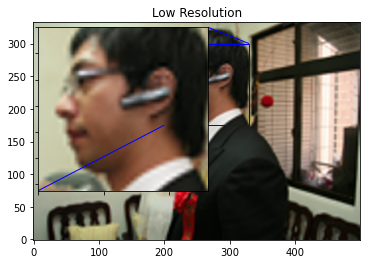

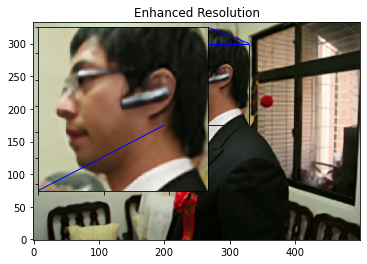

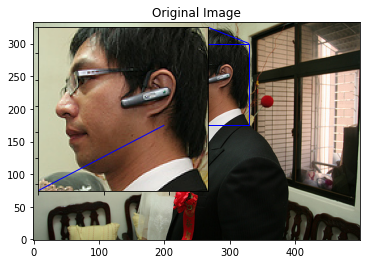

PSNR of LR image and HR image is: 26.014811
PSNR of ER image and HR image is: 27.595713
1/1 [==============================] - 0s 75ms/step


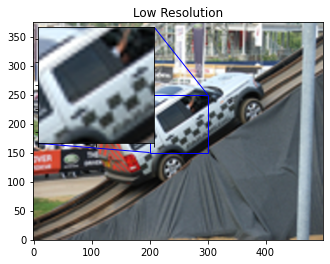

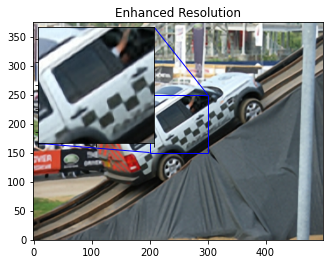

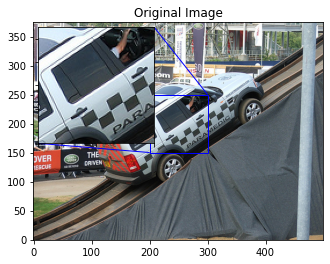

PSNR of LR image and HR image is: 20.044607
PSNR of ER image and HR image is: 20.856319
1/1 [==============================] - 0s 62ms/step


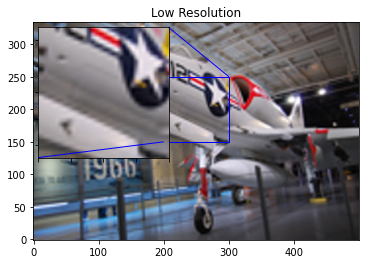

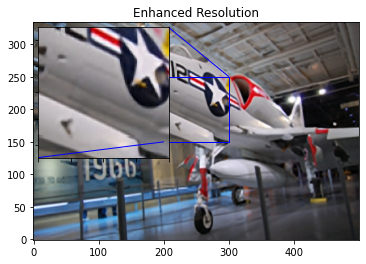

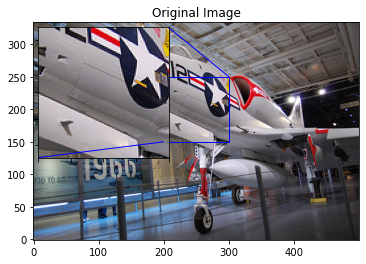

PSNR of LR image and HR image is: 23.154594
PSNR of ER image and HR image is: 24.189999


In [17]:
for index, _ in enumerate(visualize_results):
    
    
    """ -------- VISUAL ASSESSMENT -------- """
    
    
    HR_image = PIL.Image.open(_)
    
    LR_image = HR_image.resize((HR_image.size[0] // upscale_factor,   # Donwscaling to LR occurs here.
                                HR_image.size[1] // upscale_factor),
                               PIL.Image.BICUBIC)
    
    ycbcr = LR_image.convert("YCbCr")       # Here, we converted the image to YCbCr because we
    y, cb, cr = ycbcr.split()               # need the Y channel for our model. We did not convert
    y = img_to_array(y)                     # it to YUV because we can't in PIL and Y in YCbCr is
    y = y.astype("float32") / 255.0         # the same as in YUV.
                                            
    input = y.reshape(1, y.shape[0], y.shape[1], y.shape[2])      # (Batch, Width, Height, Channels)
    
    output = model.predict(input)
    output = output[0]                                            # (Width, Height, Channels)
    output *= 255.0
    output = output.clip(0, 255)
    output = output.reshape((output.shape[0], output.shape[1]))   # (Width, Height)
    output = PIL.Image.fromarray(np.uint8(output))
    output = output.resize(HR_image.size, PIL.Image.Resampling.NEAREST)   # This step is necessary to
                                                                          # fill missing pixels from
                                                                          # the prediction process.
            
    cb = cb.resize(output.size, PIL.Image.Resampling.BICUBIC)          
    cr = cr.resize(output.size, PIL.Image.Resampling.BICUBIC)
    
    ER_image = PIL.Image.merge("YCbCr", (output, cb, cr))
    ER_image = ER_image.convert("RGB")
     
    LR_image = LR_image.resize(ER_image.size, PIL.Image.Resampling.BICUBIC)  # Resizing LR for plotting.
                                                                             
    if index in z.keys():      # Custom zoom values for each image if given in 'z' dictionary.
                               # If not given, use default zoom values in the 'else' statement.
            
        plot_results(LR_image, index, 'Low Resolution', z[index][0], z[index][1], z[index][2], z[index][3])

        plot_results(ER_image, index, 'Enhanced Resolution', z[index][0], z[index][1], z[index][2], z[index][3])

        plot_results(HR_image, index, 'Original Image', z[index][0], z[index][1], z[index][2], z[index][3])
        
    else:                      # Default zoom values: 200, 300, 150, 250.
        
        plot_results(LR_image, index, 'Low Resolution')

        plot_results(ER_image, index, 'Enhanced Resolution')

        plot_results(HR_image, index, 'Original Image')
    
    
    """ -------- ACCURACY CALCULATION --------"""
    
    
    LR_arr = img_to_array(LR_image)
    HR_arr = img_to_array(HR_image)
    ER_arr = img_to_array(ER_image)
    
    bicubic_psnr = tf.image.psnr(LR_arr, HR_arr, max_val=255)
    test_psnr = tf.image.psnr(ER_arr, HR_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print("PSNR of LR image and HR image is: %f" % bicubic_psnr)
    print("PSNR of ER image and HR image is: %f" % test_psnr)

In [18]:
print("Avgerage PSNR of LR images is: %f" % (total_bicubic_psnr / (index + 1)))
print("Avgerage PSNR of ER images is: %f" % (total_test_psnr / (index + 1)))

Avgerage PSNR of LR images is: 24.234150
Avgerage PSNR of ER images is: 25.235155


# Conclusion:

We can notice the difference in quality between LR and ER images either in visual assessment or accuracy calculation. The model performed very well on the edges of colors due to the addition of the Residual Dense Network (RDN), but small improvement in the overall quality of the image. Further improvements are definitely possible.